# SVM и его ядра

В этом задании нам предстоит решить задачу SVM при помощи `cvxopt` и применить ее к искуственным данным. Затем аналогичным способом нужно будет решить задачу ядерного SVM и исследовать его поведение для различных ядер и значений их параметров.

In [1]:
import random
from typing import Callable

import matplotlib.pyplot as plt
import numpy
from cvxopt import matrix, solvers
from sklearn.datasets import make_blobs, make_moons

solvers.options["show_progress"] = False

In [2]:
SEED = 7
numpy.random.seed(SEED)
random.seed(SEED)

In [3]:
def visualize(clf, X, y):
    x_min, x_max = X[:, 0].min(), X[:, 0].max()
    y_min, y_max = X[:, 1].min(), X[:, 1].max()
    x_border = (x_max - x_min) / 20 + 1.0e-3
    x_h = (x_max - x_min + 2 * x_border) / 200
    y_border = (y_max - y_min) / 20 + 1.0e-3
    y_h = (y_max - y_min + 2 * y_border) / 200

    cm = plt.cm.Spectral

    xx, yy = numpy.meshgrid(
        numpy.arange(x_min - x_border, x_max + x_border, x_h), numpy.arange(y_min - y_border, y_max + y_border, y_h)
    )
    mesh = numpy.c_[xx.ravel(), yy.ravel()]

    z_class = clf.predict(mesh).reshape(xx.shape)

    # Put the result into a color plot
    plt.figure(1, figsize=(8, 8))
    plt.pcolormesh(xx, yy, z_class, cmap=cm, alpha=0.3, shading="gouraud")

    # Plot hyperplane and margin
    z_dist = clf.decision_function(mesh).reshape(xx.shape)
    plt.contour(xx, yy, z_dist, [0.0], colors="black")
    plt.contour(xx, yy, z_dist, [-1.0, 1.0], colors="black", linestyles="dashed")

    # Plot also the training points
    y_pred = clf.predict(X)

    ind_support = []
    ind_correct = []
    ind_incorrect = []
    for i in range(len(y)):
        if i in clf.support:
            ind_support.append(i)
        elif y[i] == y_pred[i]:
            ind_correct.append(i)
        else:
            ind_incorrect.append(i)

    plt.scatter(
        X[ind_correct, 0], X[ind_correct, 1], c=y[ind_correct], cmap=cm, alpha=1.0, edgecolor="black", linewidth=0.8
    )
    plt.scatter(
        X[ind_incorrect, 0],
        X[ind_incorrect, 1],
        c=y[ind_incorrect],
        cmap=cm,
        alpha=1.0,
        marker="*",
        s=50,
        edgecolor="black",
        linewidth=0.8,
    )
    plt.scatter(
        X[ind_support, 0],
        X[ind_support, 1],
        c=y[ind_support],
        cmap=cm,
        alpha=1.0,
        edgecolor="yellow",
        linewidths=1.0,
        s=40,
    )

    plt.xlim(xx.min(), xx.max())
    plt.ylim(yy.min(), yy.max())
    plt.tight_layout()

In [4]:
def generate_moons_dataset(n_points=1000, noise=0.075):
    X, y = make_moons(n_points, noise=noise, random_state=SEED)
    return X, 2 * y - 1

def generate_blobs_dataset(n_points=1000, n_features=2):
    X, y = make_blobs(n_points, n_features, centers=[[0, 0], [-4, 2], [3.5, -2.0], [3.5, 3.5]], random_state=SEED)
    y = 2 * (y % 2) - 1
    return X, y

X_moons, y_moons = generate_moons_dataset()
X_blobs, y_blobs = generate_blobs_dataset()

### Задание 1 (2 балла)
Для начала реализуем обычный линейный SVM.

#### Методы
`fit(X, y)` - обучает SVM, решая задачу оптимизации при помощи `cvxopt.solvers.qp`

`decision_function(X)` - возвращает значение решающей функции (т.е. то число, от которого берем знак с целью узнать класс)

#### Поля
`support` - индексы опорных элементов

### Решение с помощью QP Solver

QP-solver решает такую задачу:

$\begin{cases}0.5 \cdot x^\text{T}Px + q^\text{T}x\rightarrow \min_x\\Gx \leq h\\Ax=b\end{cases}$

А наша задача формулируется так:

$\begin{cases}0.5 \cdot w^\text{T}w + C \cdot \sum \xi_i \rightarrow \min_{w, \xi} \\ \xi \geq 0 \\ y_i (w^\text{T}x_i + w_0) \geq 1 - \xi_i \end{cases}$

Сведем ее к задаче QP-solver'а:

$ x = (w, w_0, \xi) \\ P =
\left[
    \begin{array}{c|c}
      I & 0\\
      \hline
      0 & 0
    \end{array}
\right] \\
q = \left[
    \begin{array}{c}
      0 \\
      \hline
      C
    \end{array}
\right] \\
 G =
\left[
    \begin{array}{c|c|c}
      0 & 0 & -I\\
      \hline
      -yX & -y & -I
    \end{array}
\right] \\ h = \left[
    \begin{array}{c}
      0 \\
      \hline
      -1
    \end{array}
\right] $

In [5]:
class LinearSVM:
    def __init__(self, C: float):
        """SVM with linear kernel

        Args:
            C: Soft margin coefficient.
        """
        self.C = C
        self.support = None
        self._weights = None
        self._bias = None

    def fit(self, X: numpy.ndarray, y: numpy.ndarray):
        """Fit SVM using cvxopt.solvers.qp

        Args:
            X: Train data, [n_samles, n_features]
            y: Binary labels (-1 or +1), [n_samples,]
        """
        n_samples, n_features = X.shape
        y = y.reshape(-1, 1)

        P = matrix(numpy.block([
            [numpy.eye(n_features), numpy.zeros((n_features, n_samples + 1))],
            [numpy.zeros((n_samples + 1, n_features)), numpy.zeros((n_samples + 1, n_samples + 1))]              
        ]))

        q = matrix(numpy.block([
            numpy.zeros(n_features + 1),
            numpy.ones(n_samples) * self.C
        ]))

        G = matrix(numpy.block([
            [numpy.zeros((n_samples, n_features)), numpy.zeros((n_samples, 1)), -numpy.eye(n_samples)], 
            [-y * X, -y, -numpy.eye(n_samples)]
        ]))

        h = matrix(numpy.block([
            [numpy.zeros((n_samples, 1))],
            [numpy.ones((n_samples, 1)) * -1]
        ]))

        solution = numpy.array(solvers.qp(P, q, G, h)['x']).reshape(n_samples + n_features + 1)
        self.w = solution[:n_features]
        self._bias = solution[n_features]

        eps = solution[n_features + 1:]
        self.support = [i for i in range(len(eps)) if eps[i] > 1e-3]



    def decision_function(self, X: numpy.ndarray) -> numpy.ndarray:
        """Calculate decision for the points, i.e. prediction without sign

        Args:
            X: Inumpyut data, [n_samples, n_features]

        Return:
            Decision for each inumpyut point, [n_samples, ]
        """
        return X @ self.w + self._bias


    def predict(self, X: numpy.ndarray) -> numpy.ndarray:
        """Classify inumpyut points

        Args:
            X: Inumpyut data, [n_samples, n_features]

        Return:
            Predicited class for each point (-1 or +1), [n_samples, ]
        """
        return numpy.sign(self.decision_function(X))


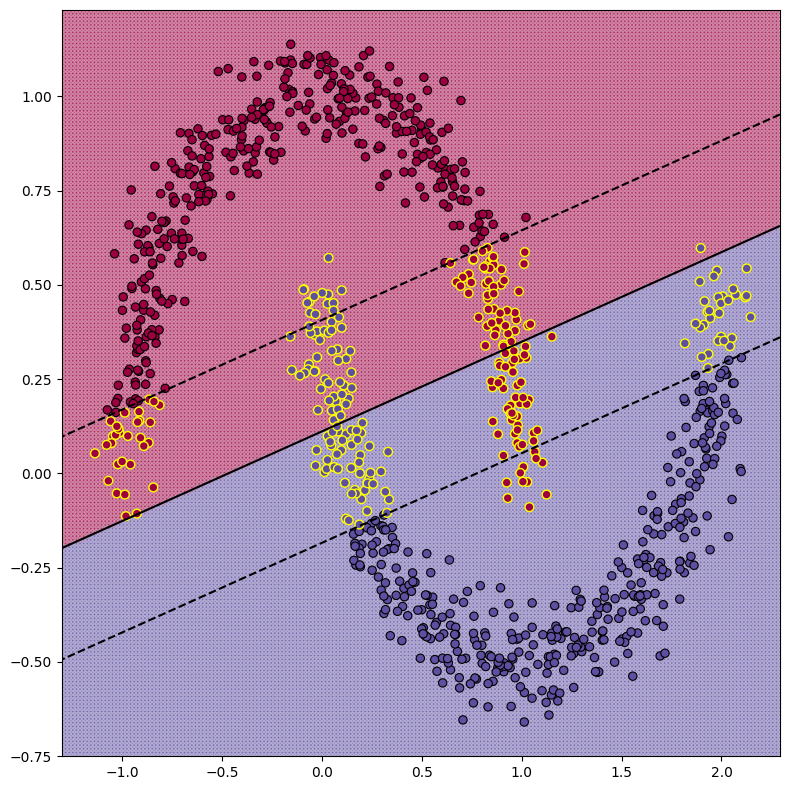

In [6]:
svm = LinearSVM(1)
svm.fit(X_moons, y_moons)
visualize(svm, X_moons, y_moons)
plt.show()

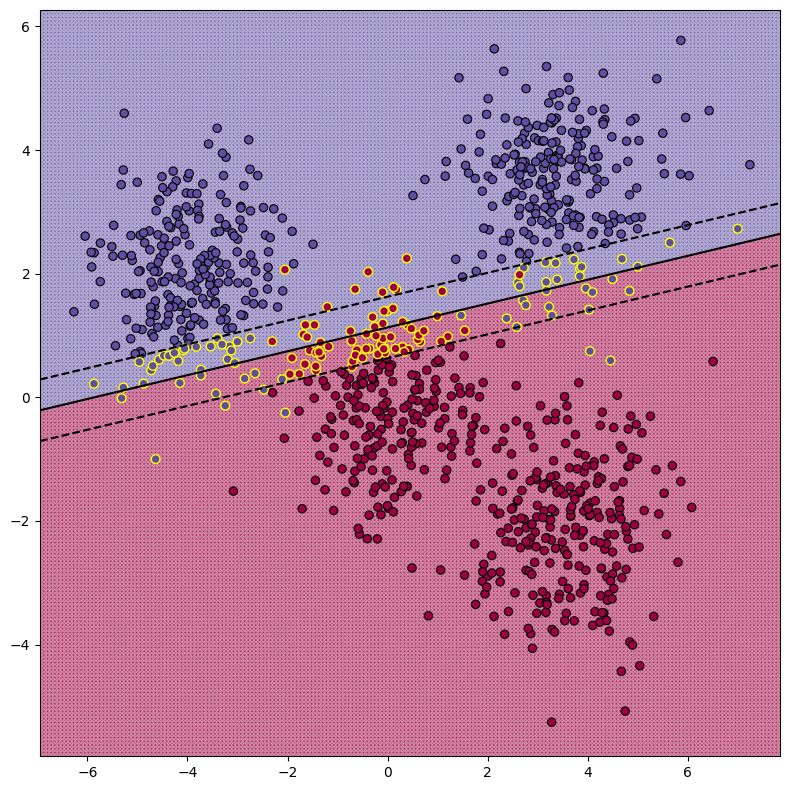

In [7]:
svm = LinearSVM(1)
svm.fit(X_blobs, y_blobs)
visualize(svm, X_blobs, y_blobs)
plt.show()

### Задание 2 (1 балл)
Перед реализацией ядерного SVM, реализуем функции, которые строят ядра.

#### Описание
`get_polynomial_kernel(power)` - возвращает полиномиальное ядро с заданной константой и степенью

`get_gaussian_kernel(sigma=1.)` - возвращает ядро Гаусса с заданным коэффицинтом сигма

In [8]:
def linear_kernel(x1: numpy.ndarray, x2: numpy.ndarray) -> numpy.ndarray:
    return x1.dot(x2.T)


def get_polynomial_kernel(c=1, power=2) -> Callable:
    
    def polynomial_kernel(x1: numpy.ndarray, x2: numpy.ndarray) -> numpy.ndarray:
        return (c + x1.dot(x2.T)) ** power

    return polynomial_kernel


def get_gaussian_kernel(sigma=1.0) -> Callable:

    def gaussian_kernel(x1: numpy.ndarray, x2: numpy.ndarray) -> numpy.ndarray:
        return numpy.exp(-numpy.linalg.norm(x2 - x1) ** 2 / (2 * sigma ** 2))

    return gaussian_kernel

### Задание 3 (2 балла)
Теперь перейдем к реализации самого kernel SVM.

#### Описание
`fit(X, y)` - обучает kernel SVM, решая задачу оптимизации при помощи `cvxopt.solvers.qp`

`decision_function(X)` - возвращает значение решающей функции (т.е. то число, от которого берем знак с целью узнать класс)

### Решение с помощью QP Solver

QP-solver решает такую задачу:

$\begin{cases}0.5 \cdot x^\text{T}Px + q^\text{T}x\rightarrow \min_x\\Gx \leq h\\Ax=b\end{cases}$

Будем решать двойственную задачу. Формулируется она так:

$\begin{cases}\sum \alpha_i - 0.5 \sum \alpha_i \alpha_j y_i y_j K(x_i, x_j) \rightarrow \max_{\alpha}\\ C \geq \alpha \geq 0 \\ y_i \alpha = 0 \end{cases}$

Сведем ее к задаче QP-solver'а:

$ x = \alpha \\ P =
\left[ y_i y_j K(x_i, x_j) \right] \\
q = \left[ -1
\right] \\
 G =
\left[
    \begin{array}{c}
      I\\
      \hline
      -I
    \end{array}
\right] \\ h = \left[
    \begin{array}{c}
      C \\
      \hline
      0
    \end{array}
\right] \\
b = 0\\
A = y^\text{T}$

В таком случае решающей функцией будет:

$a(x) = \text{sign} (\sum \alpha_i y_i K(x, x_i) + w_0)$, где $w_0 = \frac{1}{n}\sum\limits_{i=1}^{n}[y_i - \sum \alpha_j y_j K(x_i, x_j)]$

In [9]:
class KernelSVM:

    _X = None
    _y = None
    w0 = None
    alphas = None

    def __init__(self, C: float, kernel: Callable = linear_kernel):
        """SVM with specified kernel

        Args:
            C: Soft margin coefficient
            kernel: Callable kernel for kernel trick
        """
        self.C = C
        self.kernel = kernel
        self.support = None

    def fit(self, X: numpy.ndarray, y: numpy.ndarray):
        """Fit SVM using cvxopt.solvers.qp

        Args:
            X: Train data, [n_samles, n_features]
            y: Binary labels (-1 or +1), [n_samples,]
        """
        self._X = X
        self._y = y.reshape(-1, 1).astype(float)
        n_samples, n_features = X.shape

        K = numpy.zeros((n_samples, n_samples))
        for i in range(n_samples):
            for j in range(n_samples):
                K[i, j] = self.kernel(X[i], X[j])

        P = matrix(numpy.outer(y, y) * K)
        
        q = matrix(-numpy.ones((n_samples, 1)))

        G = matrix(numpy.block([
            [numpy.eye(n_samples)], 
            [-numpy.eye(n_samples)]
        ]))

        h = matrix(numpy.block([
            [numpy.ones((n_samples, 1)) * self.C],
            [numpy.zeros((n_samples, 1))]
        ]))

        b = matrix(0.0)

        A = matrix(self._y.T)

        self.alphas = numpy.ravel(solvers.qp(P, q, G, h, A, b)['x'])

        self.support = [i for i in range(len(self.alphas)) if self.alphas[i] > 1e-3]

        self._X = self._X[self.support]
        self._y = self._y[self.support]
        self.alphas = self.alphas[self.support]

        self.w0 = 0
        if len(self.support) > 0:
            for i in range(len(self.support)):
                s = 0
                for alpha, label, sv in zip(self.alphas, self._y, self._X):
                    s += alpha * label * self.kernel(self._X[i], sv)
                
                self.w0 += self._y[i] - s
            
            self.w0 /= len(self.support)

    def decision_function(self, X: numpy.ndarray) -> numpy.ndarray:
        """Calculate decision for the points, i.e. prediction without sign

        Args:
            X: Inumpyut data, [n_samples, n_features]

        Return:
            Decision for each inumpyut point, [n_samples, ]
        """            
        if len(X) == 1:
            X = X.reshape(1, -1)
            
        n_samples = X.shape[0]
        y_pred = numpy.zeros(n_samples)

        for i in range(n_samples):
            s = 0
            for alpha, label, sv in zip(self.alphas, self._y, self._X):
                s += alpha * label * self.kernel(X[i], sv)
            y_pred[i] = s + self.w0
        
        return y_pred

    def predict(self, X: numpy.ndarray) -> numpy.ndarray:
        """Classify inumpyut points

        Args:
            X: Inumpyut data, [n_samples, n_features]

        Return:
            Predicited class for each point (-1 or +1), [n_samples, ]
        """
        return numpy.sign(self.decision_function(X))
    
    def get_params(self, deep=True):
        return {"C": self.C, "kernel": self.kernel}
    
    def set_params(self, **params):
        if "C" in params:
            self.coef = params["C"]
        if "kernel" in params:
            self.coef = params["kernel"]
        return self


/tmp/ipykernel_31640/2126723724.py:91: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y_pred[i] = s + self.w0


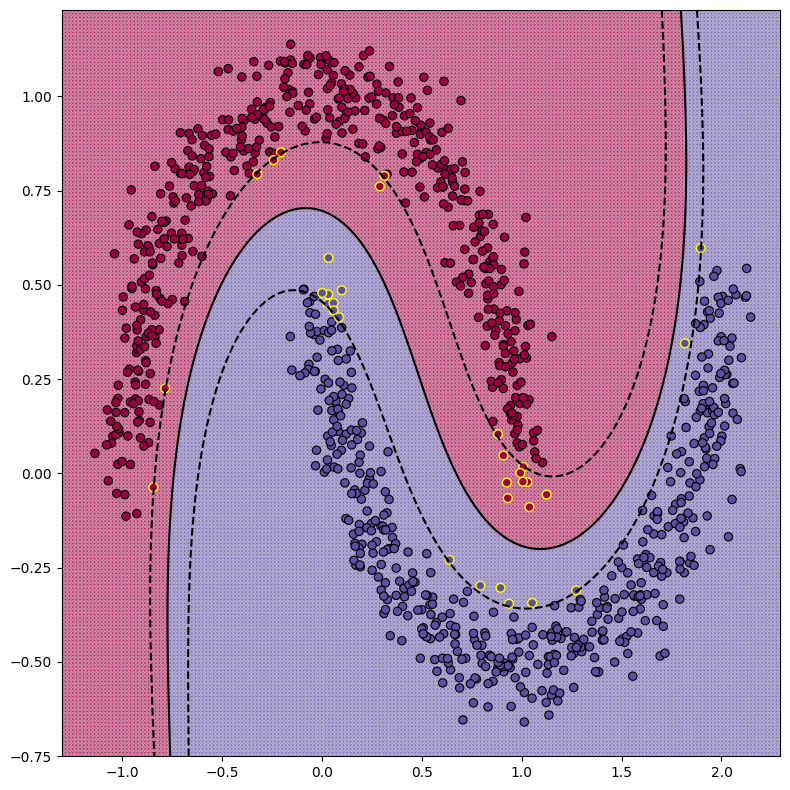

In [10]:
svm = KernelSVM(1, kernel=get_polynomial_kernel(1, 3))
svm.fit(X_moons, y_moons)
visualize(svm, X_moons, y_moons)
plt.show()

/tmp/ipykernel_31640/2126723724.py:91: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y_pred[i] = s + self.w0


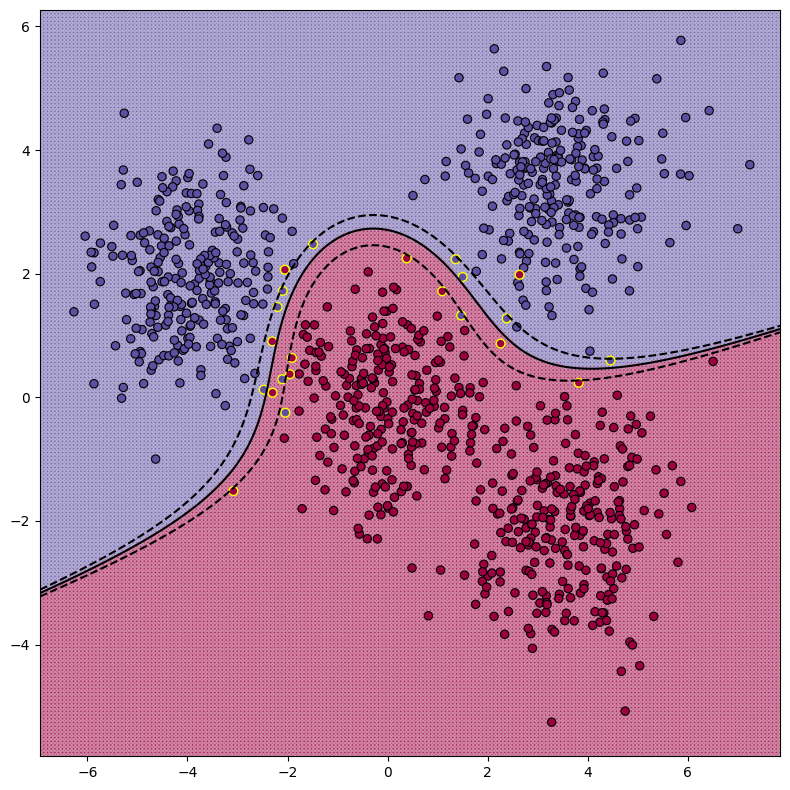

In [11]:
svm = KernelSVM(1, kernel=get_polynomial_kernel(1, 3))
svm.fit(X_blobs, y_blobs)
visualize(svm, X_blobs, y_blobs)
plt.show()

/tmp/ipykernel_31640/2126723724.py:91: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y_pred[i] = s + self.w0


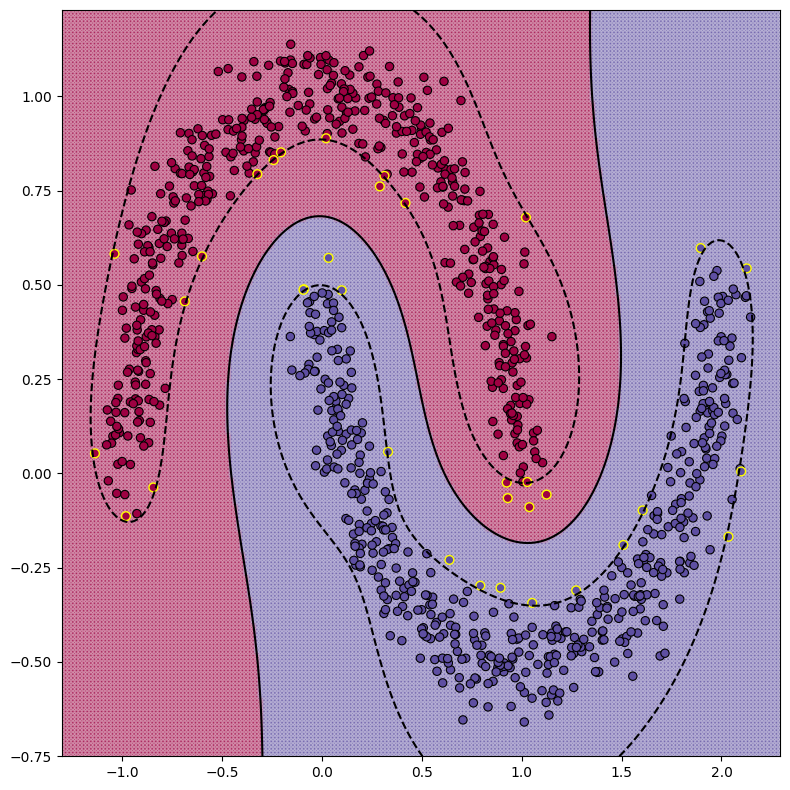

In [12]:
svm = KernelSVM(1, kernel=get_gaussian_kernel(0.4))
svm.fit(X_moons, y_moons)
visualize(svm, X_moons, y_moons)
plt.show()

/tmp/ipykernel_31640/2126723724.py:91: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y_pred[i] = s + self.w0


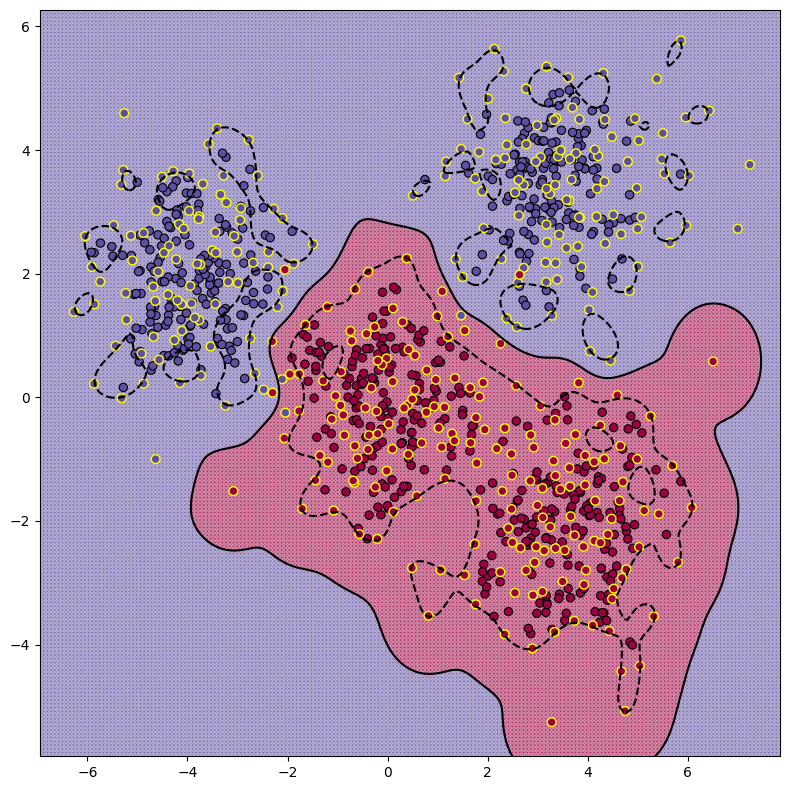

In [13]:
svm = KernelSVM(1, kernel=get_gaussian_kernel(0.4))
svm.fit(X_blobs, y_blobs)
visualize(svm, X_blobs, y_blobs)
plt.show()

### Задание 4 (2 балла)
Исследуйте и опишите влияние параметров каждого вида ядра на полученный классификатор. Что происходит при увеличении константы в полиномиальном ядре? При увеличении степени? Как влияет на результат сигма в ядре Гаусса?

__При выполнении этого задания стоит написать код, который визуализирует классификаторы с различными ядрами__

### Polynomial kernel

/tmp/ipykernel_31640/2126723724.py:91: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y_pred[i] = s + self.w0
/tmp/ipykernel_31640/2074231739.py:19: UserWarning: Ignoring specified arguments in this call because figure with num: 1 already exists
  plt.figure(1, figsize=(8, 8))


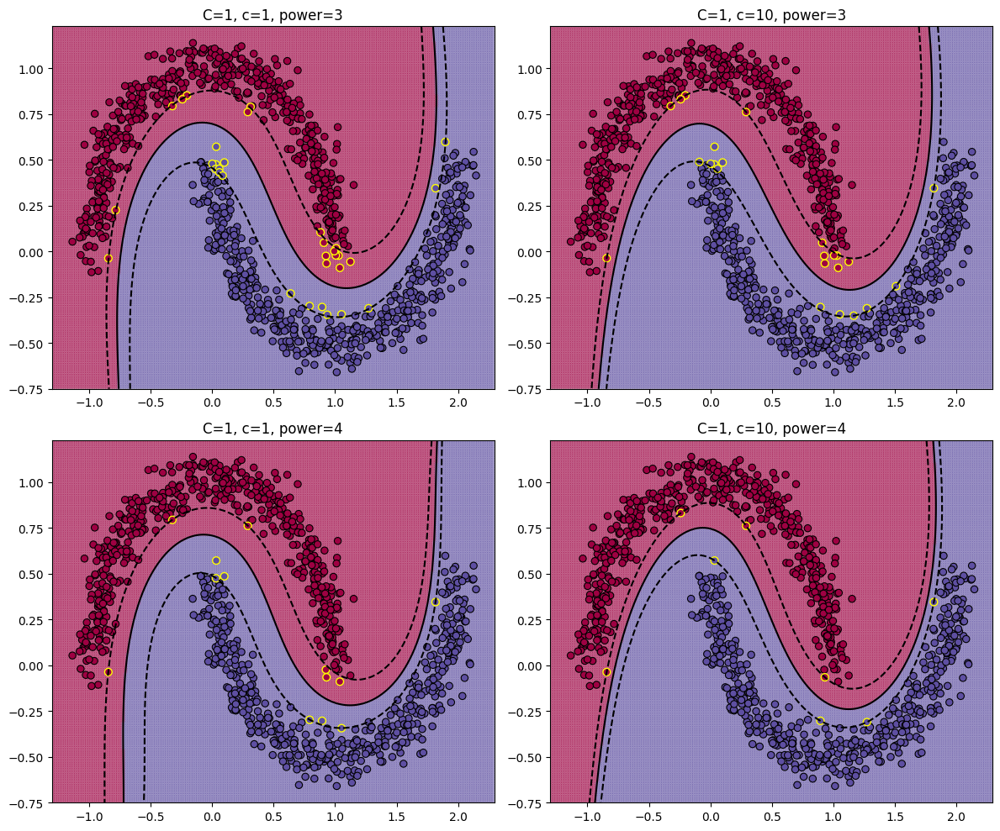

In [ ]:
fig, axes = plt.subplots(2, 2, figsize=(12, 10))

params = [
    {"C": 1, "c": 1, "power": 3},
    {"C": 1, "c": 10, "power": 3},
    {"C": 1, "c": 1, "power": 4},
    {"C": 1, "c": 10, "power": 4},
]

for i, ax in enumerate(axes.flat):
    kernel = get_polynomial_kernel(params[i]["c"], params[i]["power"])
    svm = KernelSVM(params[i]["C"], kernel=kernel)
    svm.fit(X_moons, y_moons)
    
    plt.sca(ax)
    visualize(svm, X_moons, y_moons)
    ax.set_title(f"C={params[i]['C']}, c={params[i]['c']}, power={params[i]['power']}")

plt.tight_layout()
plt.show()

/tmp/ipykernel_31640/2126723724.py:91: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y_pred[i] = s + self.w0
/tmp/ipykernel_31640/2074231739.py:19: UserWarning: Ignoring specified arguments in this call because figure with num: 1 already exists
  plt.figure(1, figsize=(8, 8))


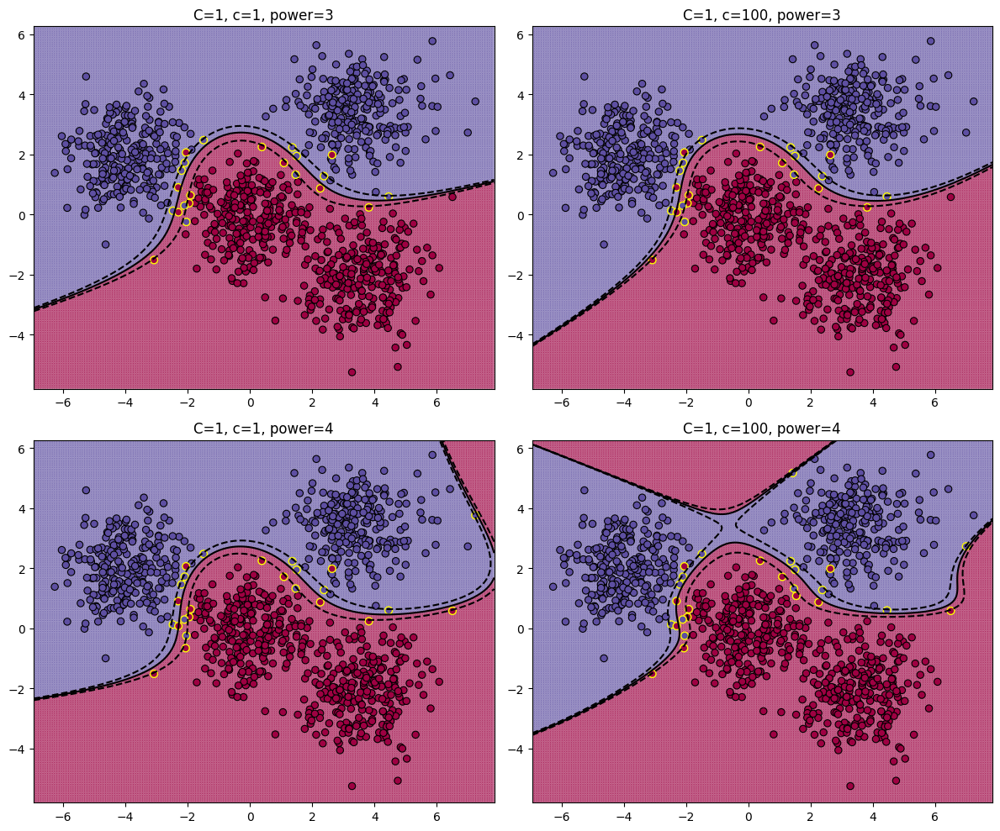

In [ ]:
fig, axes = plt.subplots(2, 2, figsize=(12, 10))

params = [
    {"C": 1, "c": 1, "power": 3},
    {"C": 1, "c": 100, "power": 3},
    {"C": 1, "c": 1, "power": 4},
    {"C": 1, "c": 100, "power": 4},
]

for i, ax in enumerate(axes.flat):
    kernel = get_polynomial_kernel(params[i]["c"], params[i]["power"])
    svm = KernelSVM(params[i]["C"], kernel=kernel)
    svm.fit(X_blobs, y_blobs)
    
    plt.sca(ax)
    visualize(svm, X_blobs, y_blobs)
    ax.set_title(f"C={params[i]['C']}, c={params[i]['c']}, power={params[i]['power']}")

plt.tight_layout()
plt.show()

**Вывод**: Чем больше c и power, тем меньше разделяющая полоса, уменьшается обобщающая способность $-$ переобучение

### RBF kernel


/tmp/ipykernel_31640/2126723724.py:91: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y_pred[i] = s + self.w0
/tmp/ipykernel_31640/2074231739.py:19: UserWarning: Ignoring specified arguments in this call because figure with num: 1 already exists
  plt.figure(1, figsize=(8, 8))


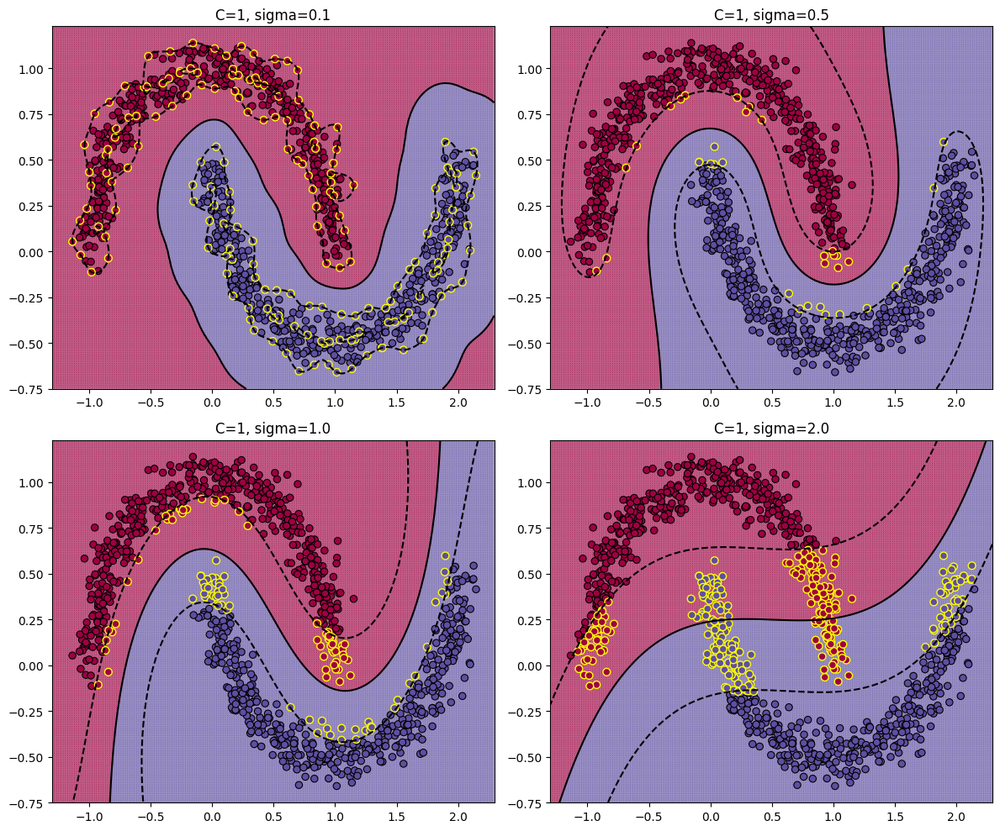

In [ ]:
fig, axes = plt.subplots(2, 2, figsize=(12, 10))

params = [
    {"C": 1, "sigma": 0.1},
    {"C": 1, "sigma": 0.5},
    {"C": 1, "sigma": 1.0},
    {"C": 1, "sigma": 2.0},
]

for i, ax in enumerate(axes.flat):
    kernel = get_gaussian_kernel(params[i]["sigma"])
    svm = KernelSVM(params[i]["C"], kernel=kernel)
    svm.fit(X_moons, y_moons)
    
    plt.sca(ax)
    visualize(svm, X_moons, y_moons)
    ax.set_title(f"C={params[i]['C']}, sigma={params[i]['sigma']}")

plt.tight_layout()
plt.show()

/tmp/ipykernel_31640/2126723724.py:91: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y_pred[i] = s + self.w0
/tmp/ipykernel_31640/2074231739.py:19: UserWarning: Ignoring specified arguments in this call because figure with num: 1 already exists
  plt.figure(1, figsize=(8, 8))


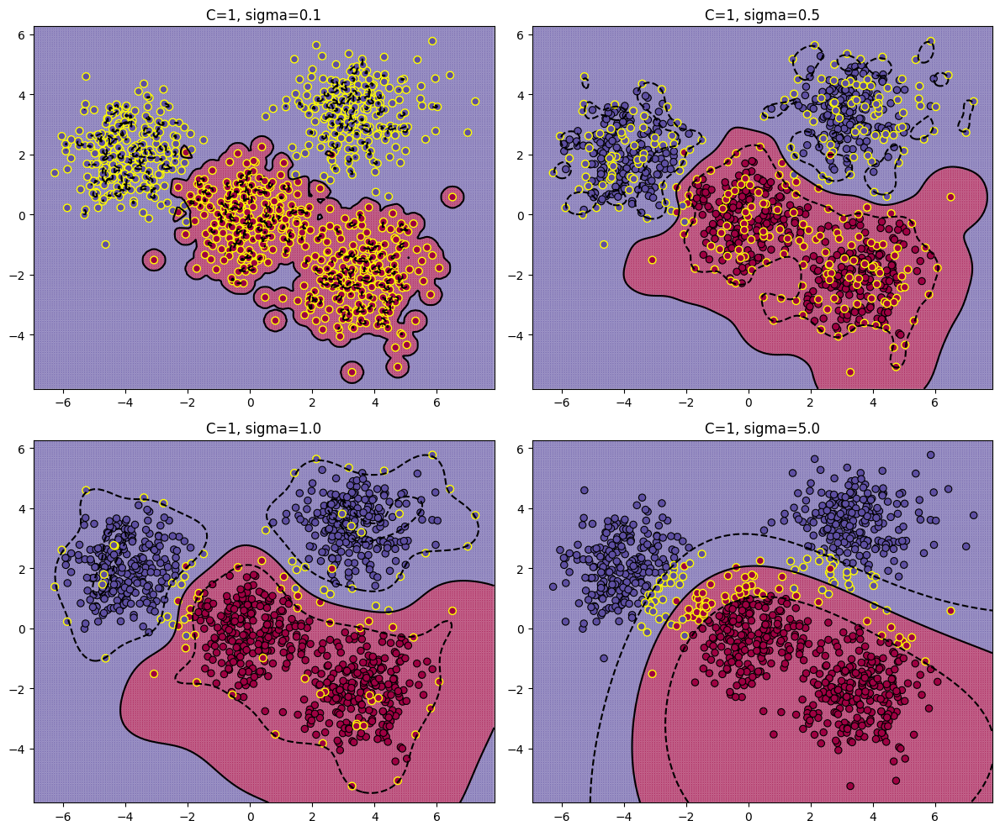

In [ ]:
fig, axes = plt.subplots(2, 2, figsize=(12, 10))

params = [
    {"C": 1, "sigma": 0.1},
    {"C": 1, "sigma": 0.5},
    {"C": 1, "sigma": 1.0},
    {"C": 1, "sigma": 5.0},
]

for i, ax in enumerate(axes.flat):
    kernel = get_gaussian_kernel(params[i]["sigma"])
    svm = KernelSVM(params[i]["C"], kernel=kernel)
    svm.fit(X_blobs, y_blobs)
    
    plt.sca(ax)
    visualize(svm, X_blobs, y_blobs)
    ax.set_title(f"C={params[i]['C']}, sigma={params[i]['sigma']}")

plt.tight_layout()
plt.show()

**Вывод**: При маленьком сигма происходит переобучение, при слишком большом $-$ переобучение, вырождается в линейный случай

# Задание 5 (3 балла)

Поставьте эксперимент и сравните SVM с логистической регрессией на синтетических данных. Для этого для каждого датасета:

1. Воспользуйтесь реализацией логистической регрессии из `sklearn`
2. Подготовьте данные, преобразуйте их для лучшей разделимости, например, добавьте polynomial features
3. Зафиксируйте метрику
4. Подберите гиперпараметры обоих моделей
5. Напишите вывод, какая из моделей обучилась лучше и почему так вышло

In [10]:
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler, PolynomialFeatures
from sklearn.model_selection import GridSearchCV, train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import precision_score, recall_score, f1_score

## Moon dataset

In [11]:
X, y = generate_moons_dataset()
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.9, random_state=42)

### Logistic Regression

In [12]:
gs_lr_pipeline = Pipeline([("scaler", StandardScaler()), ("poly", PolynomialFeatures(degree=3)), ("classifier", LogisticRegression(max_iter=1000, random_state=42))])

lr_params = {
    'poly__degree': [2, 3, 4],
    'classifier__C': [0.001, 0.01, 0.1, 1, 2, 5, 7, 10],
}

lr_grid = GridSearchCV(
    estimator=gs_lr_pipeline,
    param_grid=lr_params,
    scoring='f1',
    cv=5,
    n_jobs=-1
)

lr_grid.fit(X_train, y_train)
print("Лучшие параметры для LR:", lr_grid.best_params_)


Лучшие параметры для LR: {'classifier__C': 1, 'poly__degree': 3}


In [13]:
lr_pipeline = lr_grid.best_estimator_

y_pred = lr_pipeline.predict(X_test)

print("Precision:", precision_score(y_test, y_pred))
print("Recall:", recall_score(y_test, y_pred))
print("F1:", f1_score(y_test, y_pred))

Precision: 0.9238683127572016
Recall: 1.0
F1: 0.960427807486631


### SVM

In [14]:
kernels = [linear_kernel]
list_sigma = numpy.logspace(0, 5, 10)
for sigma in list_sigma:
    kernels.append(get_gaussian_kernel(sigma))

list_c = numpy.logspace(0, 10, 10)
for c in list_c:
    for power in range(2, 4):
        kernels.append(get_polynomial_kernel(c, power))

In [ ]:
gs_SVM_pipeline = Pipeline([("scaler", StandardScaler()), ("poly", PolynomialFeatures(degree=3)), ("classifier", KernelSVM(1, get_gaussian_kernel()))])


SVM_params = {
    'poly__degree': [2, 3, 4],
    'classifier__C': [0.001, 0.01, 0.1, 1, 2, 5, 7, 10],
    'classifier__kernel': kernels
}

svm_grid = GridSearchCV(
    estimator=gs_SVM_pipeline,
    param_grid=SVM_params,
    scoring='f1',
    cv=5,
    n_jobs=-1,
    verbose=0
)

svm_grid.fit(X_train, y_train)

In [16]:
print("Лучшие параметры для SVM:", svm_grid.best_params_)


Лучшие параметры для SVM: {'classifier__C': 0.001, 'classifier__kernel': <function linear_kernel at 0x78ebb333c9a0>, 'poly__degree': 2}


In [17]:
SVM_pipeline = svm_grid.best_estimator_

y_pred = SVM_pipeline.predict(X_test)

print("Precision:", precision_score(y_test, y_pred))
print("Recall:", recall_score(y_test, y_pred))
print("F1:", f1_score(y_test, y_pred))

/tmp/ipykernel_37632/2126723724.py:91: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y_pred[i] = s + self.w0


Precision: 1.0
Recall: 1.0
F1: 1.0


/home/sashka/python_spbu_TP23_sem4/.venv/lib/python3.12/site-packages/sklearn/pipeline.py:62: FutureWarning: This Pipeline instance is not fitted yet. Call 'fit' with appropriate arguments before using other methods such as transform, predict, etc. This will raise an error in 1.8 instead of the current warning.
  warnings.warn(


## Blobs dataset

In [18]:
X, y = generate_blobs_dataset()

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.9, random_state=42)

### Logistic Regression

In [19]:
gs_lr_pipeline = Pipeline([("scaler", StandardScaler()), ("poly", PolynomialFeatures(degree=3)), ("classifier", LogisticRegression(max_iter=1000, random_state=42))])

lr_params = {
    'poly__degree': [2, 3, 4],
    'classifier__C': [0.001, 0.01, 0.1, 1, 2, 5, 7, 10],
}

lr_grid = GridSearchCV(
    estimator=gs_lr_pipeline,
    param_grid=lr_params,
    scoring='f1',
    cv=5,
    n_jobs=-1
)

lr_grid.fit(X_train, y_train)
print("Лучшие параметры для LR:", lr_grid.best_params_)


Лучшие параметры для LR: {'classifier__C': 1, 'poly__degree': 2}


In [20]:
lr_pipeline = lr_grid.best_estimator_

y_pred_lr = lr_pipeline.predict(X_test)

print("Precision:", precision_score(y_test, y_pred_lr))
print("Recall:", recall_score(y_test, y_pred_lr))
print("F1:", f1_score(y_test, y_pred_lr))

Precision: 0.9845132743362832
Recall: 0.9758771929824561
F1: 0.9801762114537445


### SVM

In [ ]:
gs_SVM_pipeline = Pipeline([("scaler", StandardScaler()), ("poly", PolynomialFeatures(degree=3)), ("classifier", KernelSVM(1, get_gaussian_kernel()))])

SVM_params = {
    'poly__degree': [2, 3, 4],
    'classifier__C': [0.001, 0.01, 0.1, 1, 2, 5, 7, 10],
    'classifier__kernel': kernels
}

svm_grid = GridSearchCV(
    estimator=gs_SVM_pipeline,
    param_grid=SVM_params,
    scoring='f1',
    cv=5,
    n_jobs=-1,
    verbose=0
)

svm_grid.fit(X_train, y_train)

In [22]:
print("Лучшие параметры для SVM:", svm_grid.best_params_)


Лучшие параметры для SVM: {'classifier__C': 0.001, 'classifier__kernel': <function linear_kernel at 0x78ebb333c9a0>, 'poly__degree': 2}


In [23]:
SVM_pipeline = svm_grid.best_estimator_

y_pred_svm = SVM_pipeline.predict(X_test)

print("Precision:", precision_score(y_test, y_pred_svm))
print("Recall:", recall_score(y_test, y_pred_svm))
print("F1:", f1_score(y_test, y_pred_svm))

/tmp/ipykernel_37632/2126723724.py:91: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y_pred[i] = s + self.w0


Precision: 0.9699570815450643
Recall: 0.9912280701754386
F1: 0.9804772234273319


/home/sashka/python_spbu_TP23_sem4/.venv/lib/python3.12/site-packages/sklearn/pipeline.py:62: FutureWarning: This Pipeline instance is not fitted yet. Call 'fit' with appropriate arguments before using other methods such as transform, predict, etc. This will raise an error in 1.8 instead of the current warning.
  warnings.warn(


**Вывод:** SVM: Moon dataset идеально разделим, поэтому с подбором параметров модели идеально определяют класс объекта. Для Blobs dataset не делится идельно, даже с подбором параметров, но даже так это раделение неплохо определяет класс: > 0.98. LR предсказывает менее точно, чем svm, так как более чувствительна к выбросам